# ERA5 comparison

Notebook to compare ERA5 output with the USV data

In [1]:
# Enable autoreload extension to automatically reload modules when they change
%load_ext autoreload
%autoreload 1

# Import necessary modules and libraries
import matplotlib.pyplot as plt                      # Matplotlib for plotting
import matplotlib.dates as mdates                    # For working with dates in matplotlib
from matplotlib.lines import Line2D                  # For custom line styles in plots

import string                                        # String module for common string operations
import numpy as np                                   # NumPy for numerical operations
import pandas as pd                                  # Pandas for data manipulation and analysis
import xarray as xr                                  # Xarray for labeled multi-dimensional arrays
import gsw_xarray as gsw                             # GSW (Gibbs SeaWater) Oceanographic module for xarray
import cartopy.crs as ccrs                           # Cartopy for cartographic projections and geospatial data
import cmocean.cm as cmo                             # Cmocean for perceptually uniform colormaps
from tqdm.notebook import tqdm_notebook as tqdm      # TQDM for progress bars in Jupyter notebooks
from scipy.stats import linregress                   # SciPy for linear regression analysis
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# Import my_funcs module for interactive reloading and custom functions
%aimport my_funcs

# Call update_params function from my_funcs module to update plot parameters
my_funcs.update_params(fontsize=30)

def white_or_black(color):
    
    c1 = "white" if color == "white" else "black"
    c2 = "black" if color == "white" else "white"
    
    plt.rcParams.update({
        'figure.facecolor': c1,  # Background color of the figure
        'axes.facecolor': c1,    # Background color inside the plot area
        'savefig.facecolor': c1, # Background color when saving the figure
        'axes.edgecolor': c2,    # Color of the axes border
        'axes.labelcolor': c2,   # Color of the axis labels
        'xtick.color': c2,       # Color of the x-tick labels
        'ytick.color': c2,       # Color of the y-tick labels
        'text.color': c2,        # Default text color
        'axes.titlecolor': c2,   # Color of the plot title
        'font.size': 24,              # Size of the font
    })

In [2]:
def wind_speed_direction_to_uv(speed, direction):
    """
    Convert wind speed and direction to u and v components.

    Parameters:
    speed (array-like): Wind speed values.
    direction (array-like): Wind direction values in degrees, measured clockwise from the north.

    Returns:
    tuple: u and v components of the wind.
    """
    direction_rad = np.deg2rad(direction)
    u = -speed * np.sin(direction_rad)
    v = -speed * np.cos(direction_rad)
    return u, v

In [3]:
# Define color variables with hexadecimal color codes
c20  = "#C13F89"  # Color for 1020
c22  = "#00B4D8"  # Color for 1022
c23  = "#0077B6"  # Color for 1023
cera = "#fe7f2d"  # Color for ERA5 data
cooi = "#25283D"  # Color for OOI data

colors = [c20, c22, c23]           # List of colors
labels = ["1020", "1022", "1023"]  # Corresponding labels

# Manually create Line2D objects for legend handles with lines
legend_lines = [
    Line2D([], [], color=c20, lw=3, label='1020'),  # Legend line for 1020
    Line2D([], [], color=c22, lw=3, label='1022'),  # Legend line for 1022
    Line2D([], [], color=c23, lw=3, label='1023')   # Legend line for 1023
]

# Manually create Line2D objects for legend handles with dots
legend_dots = [
    Line2D([], [], color=c20, lw=0, marker='.', ms=25, label='1020'),  # Legend dot for 1020
    Line2D([], [], color=c22, lw=0, marker='.', ms=25, label='1022'),  # Legend dot for 1022
    Line2D([], [], color=c23, lw=0, marker='.', ms=25, label='1023')   # Legend dot for 1023
]

In [24]:
ds20 = xr.open_dataset("../data/ds20qc_1min_height_with_ssh.nc")
ds22 = xr.open_dataset("../data/ds22qc_1min_height_with_ssh.nc")
ds23 = xr.open_dataset("../data/ds23qc_1min_height_with_ssh.nc")

# Rename variables for consistency
#ds20 = ds20[var_to_keep].rename({"TEMP_AIR_MEAN": "at", "TEMP_CTD_RBR_MEAN": "sst", "SAL_RBR_MEAN": "sss", "sensible": "sshf"})
ds20 = ds20.rename({"TEMP_AIR_MEAN": "at", "TEMP_CTD_RBR_MEAN": "sst", "SAL_RBR_MEAN": "sss", "sensible": "sshf"})
#ds22 = ds22[var_to_keep].rename({"TEMP_AIR_MEAN": "at", "TEMP_CTD_RBR_MEAN": "sst", "SAL_RBR_MEAN": "sss", "sensible": "sshf"})
ds22 = ds22.rename({"TEMP_AIR_MEAN": "at", "TEMP_CTD_RBR_MEAN": "sst", "SAL_RBR_MEAN": "sss", "sensible": "sshf"})
#ds23 = ds23[var_to_keep].rename({"TEMP_AIR_MEAN": "at", "TEMP_CTD_RBR_MEAN": "sst", "SAL_RBR_MEAN": "sss", "sensible": "sshf"})
ds23 = ds23.rename({"TEMP_AIR_MEAN": "at", "TEMP_CTD_RBR_MEAN": "sst", "SAL_RBR_MEAN": "sss", "sensible": "sshf"})


datasets = [ds20, ds22, ds23]

era = xr.open_dataset("../data/ERA5.nc")  # ERA5 dataset

In [5]:
def extract_1hr_ds(ds, era):
    """
    Extracts and processes 1-hourly data from the given dataset and ERA5 dataset.

    Parameters:
    ds (xarray.Dataset): The input dataset containing high-resolution data.
    era (xarray.Dataset): The ERA5 dataset containing hourly data.

    Returns:
    tuple: A tuple containing:
        - dsh (xarray.Dataset): The input dataset resampled to 1-hour intervals.
        - erads (xarray.Dataset): The ERA5 dataset subset for the matching times.
        - era5ts (xarray.Dataset): The ERA5 dataset interpolated to the locations and times of the input dataset.
    """
    
    # Find the intersection of times between the input dataset and the hourly ERA5 dataset
    matching_times, matching_indices, _ = np.intersect1d(ds.time.values, np.unique(ds.time.dt.floor('h').values), return_indices=True)
    
    # Select the matching times from the input dataset
    dsh = ds.isel(time=matching_indices)
    
    # Resample the 'sshf' variable to 1-hour intervals and take the mean
    dsh["sshf"] = ds.resample(time="1h").mean("time")["sshf"][1:]  # The ERA5 data for this variable is an hourly average, not a snapshot.

    # Select the matching times from the ERA5 dataset
    erads = era.sel(time=matching_times)

    # Extract time, latitude, and longitude from the resampled dataset
    times      = dsh.time.values
    longitudes = dsh.longitude.values
    latitudes  = dsh.latitude.values
    
    # Retrieve ERA5 data for corresponding time, latitude, and longitude
    era5_data = []
    for time, lat, lon in tqdm(zip(times, latitudes, longitudes), desc="Extracting ERA5 data"):
        era5_data.append(era.sel(time=time).sel(longitude=lon, method='nearest').sel(latitude=lat, method='nearest'))

    # Concatenate the extracted ERA5 data along the time dimension
    era5ts = xr.concat(era5_data, dim='time')

    # Calculate wind direction in degrees from u and v wind components
    era5ts['wind_from'] = ('time'), ((np.rad2deg(np.arctan2(era5ts['u10'], era5ts['v10'])) + 180) % 360).values
    
    # Calculate wind speed from u and v wind components
    era5ts['wind_speed'] = np.sqrt(era5ts['u10']**2 + era5ts['v10']**2)
    
    # Convert temperature from Kelvin to Celsius
    era5ts["t2m"] = era5ts["t2m"] - 273.15
    era5ts["sst"] = era5ts["sst"] - 273.15
    
    # Convert sensible heat flux from J/m^2 to W/m^2
    era5ts["sshf"] = era5ts["sshf"] / 3600
    
    # Calculate the distance between the ERA5 and input dataset locations
    era5ts["distance"] = ("time"), [gsw.distance([lon1, lon2], [lat1, lat2])[0] / 1000 for lon1, lon2, lat1, lat2 in zip(era5ts["longitude"].values, dsh["longitude"].values, era5ts["latitude"].values, dsh["latitude"].values)]
    
    return dsh, erads, era5ts

In [6]:
ds20h,era20,era20ts = extract_1hr_ds(ds20,era)
ds22h,era22,era22ts = extract_1hr_ds(ds22,era)
ds23h,era23,era23ts = extract_1hr_ds(ds23,era)

Extracting: 0it [00:00, ?it/s]

Extracting: 0it [00:00, ?it/s]

Extracting: 0it [00:00, ?it/s]

In [9]:
def plot_scatter_correlations(ax,ds,era5,c,label,size="medium",legend_in=True):

    mask = np.isfinite(ds[v])
    s,i,r,p,_  = linregress(ds[v][mask],era5[v][mask])
    if v == "wind_from":
        rmse = np.round(np.sqrt(np.mean(np.square(wind_direction_difference(era5[v][mask], ds[v][mask])))).values,2)
        bias = np.round(np.mean(wind_direction_difference(era5[v][mask], ds[v][mask])).values,2)
    else:
        rmse = np.round(np.sqrt(np.mean(np.square(-ds[v][mask]+era5[v][mask]))).values,2)
        bias = np.round(np.mean(-ds[v][mask]+era5[v][mask]).values,2)

    
    #ax2.plot(np.array(yl),np.array(yl)*s + i,ls="-",lw=3,c="w")
    ax.plot(np.array(yl),np.array(yl)*s + i,ls="--",lw=5,c=c,zorder=4)
    
    sd = Line2D([0,1], [0.5, 0.5],  color=c,    ls='-',  lw=3)
    e5 = Line2D([0,1], [0.5, 0.5],  color=cera, ls='-',  lw=3)
    one = Line2D([0,1], [0.5, 0.5], color='k',  ls=':',  lw=1)
    fit = Line2D([0,1], [0.5, 0.5], color=c,  ls="--", lw=2)
    tom = Line2D([0,1], [0.5, 0.5], color='w',  ls="--", lw=2)

    sign = '+' if np.round(i,2) >= 0 else '-'
    
    if legend_in:
        ax.legend(handles = ((fit,tom,tom,tom)), #sd,e5,one,
                   labels = (#label,
                             #"ERA5",
                             #"1:1",
                             f"y = {np.round(s,2)}x {sign} {np.abs(np.round(i,2))}",
                             r"R$^2$ = {}".format(np.round(r**2,2)),
                             #r"p-value = {}".format(np.round(p,3)),
                             f"RMSE = {rmse} {u[1:-1]}",
                             f"Bias = {bias} {u[1:-1]}"), 
    
                   handlelength = 1,
                   ncol = 1, 
                   frameon = True,
                   fontsize = size, 
                   framealpha = 0.75,
                   #title = f"Wind speed\n5-20 m "+'s$^{-1}$' if 'm' in var else None,
                   loc='lower right')#, bbox_to_anchor=(1, 0.5))
                   #loc='upper left')
    else:
        ax.legend(handles = ((fit,tom,tom,tom)), #sd,e5,one,
                   labels = (#label,
                             #"ERA5",
                             #"1:1",
                             f"y = {np.round(s,2)}x {sign} {np.abs(np.round(i,2))}",
                             r"R$^2$ = {}".format(np.round(r**2,2)),
                             #r"p-value = {}".format(np.round(p,3)),
                             f"RMSE = {rmse} {u[1:-1]}",
                             f"Bias = {bias} {u[1:-1]}"), 
    
                   handlelength = 1,
                   ncol = 1, 
                   frameon = True,
                   fontsize = size, 
                   framealpha = 0.75,
                   #title = f"Wind speed\n5-20 m "+'s$^{-1}$' if 'm' in var else None,
                   loc='upper left', bbox_to_anchor=(1, 1))
                   #loc='upper left')
        

    ax.scatter(ds[v],era5[v],c='k',ec="None")

    
    ax.set_aspect('equal', adjustable='box')
    ax.set(xlim=yl,ylim=yl)
    ax.set_xlabel(f"{l} {u}",c=c)
    ax.set_ylabel(f"ERA5 {u}",c=cera)
    #ax.grid()

    
    ax.plot(yl,yl, c='k', lw=1, zorder=3, ls=':')
    ax.fill((yl[0], yl[1], yl[1], yl[0]), (yl[0], yl[1], yl[0], yl[0]), color = c, alpha=0.1,zorder=1)
    ax.fill((yl[0], yl[1], yl[0], yl[0]), (yl[0], yl[1], yl[1], yl[0]), color = cera, alpha=0.1,zorder=1)

    for spine,color,axis in zip(['left','bottom'],[cera,c],['y','x']):
        ax.spines[spine].set_color(color)
        ax.spines[spine].set_zorder(10)
        ax.spines[spine].set_linewidth(3)
        ax.tick_params(axis=axis, colors = cera if axis == "y" else color)

    # Create a DataFrame to store the calculated statistics
    stats_df = pd.DataFrame({
        "Variable": [v],
        'Slope': [s],
        'Intercept': [i],
        'R-squared': [r**2],
        'p-value': [p],
        'RMSE': [rmse],
        'Bias': [bias]
    })

    return stats_df

In [12]:
for dsh, ds, era in zip([ds20h, ds22h, ds23h], [ds20, ds22, ds23], [era20ts, era22ts, era23ts]):
    ds["mday"] = ("time"), (ds.time.data - ds.time.data[0]).astype(float) / 86400
    dsh["mday"] = ("time"), (dsh.time.data - dsh.time.data[0]).astype(float) / 86400
    era["mday"] = ("time"), (era.time.data - era.time.data[0]).astype(float) / 86400

In [14]:
def plot_scatter_correlations(ax,ds,era5,c,label,size="medium",legend_in=True):

    mask = np.isfinite(ds[v])
    s,i,r,p,_  = linregress(ds[v][mask],era5[v][mask])
    if v == "wind_from":
        rmse = np.round(np.sqrt(np.mean(np.square(wind_direction_difference(era5[v][mask], ds[v][mask])))).values,2)
        bias = np.round(np.mean(wind_direction_difference(era5[v][mask], ds[v][mask])).values,2)
    else:
        rmse = np.round(np.sqrt(np.mean(np.square(-ds[v][mask]+era5[v][mask]))).values,2)
        bias = np.round(np.mean(-ds[v][mask]+era5[v][mask]).values,2)

    
    #ax2.plot(np.array(yl),np.array(yl)*s + i,ls="-",lw=3,c="w")
    ax.plot(np.array(yl),np.array(yl)*s + i,ls="--",lw=5,c=c,zorder=4)
    
    sd = Line2D([0,1], [0.5, 0.5],  color=c,    ls='-',  lw=3)
    e5 = Line2D([0,1], [0.5, 0.5],  color=cera, ls='-',  lw=3)
    one = Line2D([0,1], [0.5, 0.5], color='k',  ls=':',  lw=1)
    fit = Line2D([0,1], [0.5, 0.5], color=c,  ls="--", lw=2)
    tom = Line2D([0,1], [0.5, 0.5], color='w',  ls="--", lw=2)

    sign = '+' if np.round(i,2) >= 0 else '-'
    
    if legend_in:
        ax.legend(handles = ((fit,tom,tom,tom)), #sd,e5,one,
                   labels = (#label,
                             #"ERA5",
                             #"1:1",
                             f"y = {np.round(s,2)}x {sign} {np.abs(np.round(i,2))}",
                             r"R$^2$ = {}".format(np.round(r**2,2)),
                             #r"p-value = {}".format(np.round(p,3)),
                             f"RMSE = {rmse} {u[1:-1]}",
                             f"Bias = {bias} {u[1:-1]}"), 
    
                   handlelength = 1,
                   ncol = 1, 
                   frameon = True,
                   fontsize = size, 
                   framealpha = 0.75,
                   #title = f"Wind speed\n5-20 m "+'s$^{-1}$' if 'm' in var else None,
                   loc='lower right')#, bbox_to_anchor=(1, 0.5))
                   #loc='upper left')
    else:
        ax.legend(handles = ((fit,tom,tom,tom)), #sd,e5,one,
                   labels = (#label,
                             #"ERA5",
                             #"1:1",
                             f"y = {np.round(s,2)}x {sign} {np.abs(np.round(i,2))}",
                             r"R$^2$ = {}".format(np.round(r**2,2)),
                             #r"p-value = {}".format(np.round(p,3)),
                             f"RMSE = {rmse} {u[1:-1]}",
                             f"Bias = {bias} {u[1:-1]}"), 
    
                   handlelength = 1,
                   ncol = 1, 
                   frameon = True,
                   fontsize = size, 
                   framealpha = 0.75,
                   #title = f"Wind speed\n5-20 m "+'s$^{-1}$' if 'm' in var else None,
                   loc='upper left', bbox_to_anchor=(1, 1))
                   #loc='upper left')
        

    ax.scatter(ds[v],era5[v],c='k',ec="None")

    
    ax.set_aspect('equal', adjustable='box')
    ax.set(xlim=yl,ylim=yl)
    ax.set_xlabel(f"{l} {u}",c=c)
    ax.set_ylabel(f"ERA5 {u}",c=cera)
    ax.grid()

    
    ax.plot(yl,yl, c='k', lw=1, zorder=3, ls=':')
    ax.fill((yl[0], yl[1], yl[1], yl[0]), (yl[0], yl[1], yl[0], yl[0]), color = c, alpha=0.1,zorder=1)
    ax.fill((yl[0], yl[1], yl[0], yl[0]), (yl[0], yl[1], yl[1], yl[0]), color = cera, alpha=0.1,zorder=1)

    for spine,color,axis in zip(['left','bottom'],[cera,c],['y','x']):
        ax.spines[spine].set_color(color)
        ax.spines[spine].set_zorder(10)
        ax.spines[spine].set_linewidth(3)
        ax.tick_params(axis=axis, colors = cera if axis == "y" else color)

    # Create a DataFrame to store the calculated statistics
    stats_df = pd.DataFrame({
        "Variable": [v],
        'Slope': [s],
        'Intercept': [i],
        'R-squared': [r**2],
        'p-value': [p],
        'RMSE': [rmse],
        'Bias': [bias]
    })

    return stats_df

In [40]:
# Create a figure with 2x2 subplots
fig, ax = plt.subplots(2, 2, figsize=(16, 16), constrained_layout=True, dpi=600)
ax = ax.flatten()

# Set plot colors to white background
white_or_black("white")

# Define variables, units, titles, y-limits, and y-ticks for the plots
variables = ["wind_speed", "t2m", "sst", "sshf"]
units = ["(m s$^{-1}$)", "(°C)", "(°C)", "(W m$^{-2}$)"]
titles = ["10-m wind speed", "2-m air temperature", "Sea surface temperature", "Sensible heat flux"]
ylims = [[0, 25], [-5, 20], [-5, 20], [-240, 100]]
yticks = [np.arange(0, 26, 5), np.arange(-5, 21, 5), np.arange(-5, 21, 5), np.arange(-200, 101, 100)]

# Initialize an empty list to store statistics
stats = []

# Loop through datasets and plot each variable
for dsh, ds, era5, c, l, I, m, z in zip([ds20h, ds22h, ds23h], [ds20, ds22, ds23], [era20ts, era22ts, era23ts], colors, ["1020", "1022", "1023"], ["A", "B", "C"], [".", ".", "."], [3, 1, 2]):
    for axs, v, u, t, yl, yt, odds in zip(ax, variables, units, titles, ylims, yticks, string.ascii_lowercase):
        # Add title to each subplot
        axs.text(0.03, 1, f"({odds}) {t}", transform=axs.transAxes, ha="left", va="top")

        # Scatter plot of the data
        axs.scatter(dsh[v], era5[v], ec="None", fc=c, s=100, alpha=0.5, zorder=z, marker=m)

        # Calculate linear regression statistics
        mask = np.isfinite(dsh[v])
        s, i, r, p, _ = linregress(dsh[v][mask], era5[v][mask])
        rmse = np.round(np.sqrt(np.mean(np.square(dsh[v][mask] - era5[v][mask]))).values, 2)
        bias = np.round(np.mean(dsh[v][mask] - era5[v][mask]).values, 2)

        # Plot the regression line and 1:1 line
        axs.plot(np.array(yl), np.array(yl) * s + i, ls="-", lw=2, c=c, zorder=4, label=f"{l} fit")
        axs.plot(np.array(yl), np.array(yl), ls=":", lw=2, c="k", zorder=50)

        # Store statistics in a DataFrame
        stats_df = pd.DataFrame({
            "Drone": [int(l)],
            "Variable": [v],
            'Slope': [s],
            'Intercept': [i],
            'R-squared': [r**2],
            'p-value': [p],
            'RMSE': [rmse],
            'Bias': [bias]
        })
        stats.append(stats_df)

        # Customize plot appearance
        axs.spines['top'].set_visible(False)
        axs.spines['right'].set_visible(False)
        axs.set(xticks=yt, yticks=yt, xlim=yl, ylim=yl, xlabel=f"USV {t} {u}", ylabel=f"ERA5 {t} {u}")

# Concatenate all statistics into a single DataFrame
stats = pd.concat(stats)

# Calculate mean statistics for each variable
statistics = stats.reset_index().drop(columns=["index", "Slope", "Intercept", "p-value"]).groupby("Variable")[['R-squared', 'RMSE', 'Bias']].mean()[::-1].reset_index().round(2)

# Define legend handles
sd1020 = Line2D([0, 1], [0.5, 0.5], color=c20, ls='--', lw=1)
sd1022 = Line2D([0, 1], [0.5, 0.5], color=c22, ls='--', lw=1)
sd1023 = Line2D([0, 1], [0.5, 0.5], color=c23, ls='--', lw=1)
one = Line2D([0, 1], [0.5, 0.5], color='w', ls=':', lw=1)
tom = Line2D([0, 1], [0.5, 0.5], color='w', ls="--", lw=1)

# Add legends to each subplot
for axs, r2, rmse, bias, u in zip(ax, statistics["R-squared"], statistics["RMSE"], statistics["Bias"], units):
    axs.legend(handles=[tom, tom, tom],
               labels=[fr"R$^2$ = {np.round(r2, 2)}",
                       f"RMSE = {rmse} {u[1:-1]}",
                       f"Bias = {bias} {u[1:-1]}"],
               handlelength=1,
               ncol=1,
               frameon=False,
               framealpha=0.75,
               loc='lower right', markerfirst=True, bbox_to_anchor=(1.05, 0))

# Add text annotations for the number of data points
for i, (ds, c, sd) in enumerate(zip([ds20h, ds22h, ds23h], colors, ["1020", "1022", "1023"])):
    ax[0].text(1, 21.5 - 1.5 * i, f"SD{sd}: n={len(ds.time)}", c=c, va="center")

# Save the figure (uncomment the line below to save the figure)
# plt.savefig("../figures/ERA5-comparison.png", dpi=900)

In [18]:
era

<xarray.Dataset> Size: 186kB
Dimensions:     (time: 2113)
Coordinates:
    longitude   (time) float32 8kB 168.2 168.2 168.2 168.2 ... -46.0 -46.0 -46.0
    latitude    (time) float32 8kB -46.75 -46.75 -46.75 ... -57.75 -57.75 -57.5
  * time        (time) datetime64[ns] 17kB 2019-05-10T01:00:00 ... 2019-08-06...
Data variables:
    u10         (time) float64 17kB 2.792 3.845 4.558 ... 3.976 4.423 4.211
    v10         (time) float64 17kB -3.117 -2.866 -2.053 ... -0.8001 -1.778
    t2m         (time) float64 17kB 15.33 15.62 15.05 ... -0.9955 -0.8789
    sst         (time) float64 17kB 13.85 13.85 13.85 ... -0.4882 -0.2284
    sshf        (time) float64 17kB -19.62 -10.1 1.556 ... 0.4671 0.1723 -1.665
    wind_from   (time) float64 17kB 318.2 306.7 294.2 ... 266.6 280.3 292.9
    wind_speed  (time) float64 17kB 4.185 4.796 4.999 ... 3.983 4.495 4.571
    distance    (time) float64 17kB 5.265 3.087 4.453 ... 12.87 14.15 14.75
    mday        (time) float64 17kB 0.0 4.167e+07 ... 8.796e+10 8.8e+10
Attributes:
    Conventions:  CF-1.6
    history:      2024-07-08 15:42:50 GMT by grib_to_netcdf-2.28.1: /opt/ecmw...

In [23]:
era.isel(time=0)

<xarray.Dataset> Size: 88B
Dimensions:     ()
Coordinates:
    longitude   float32 4B 168.2
    latitude    float32 4B -46.75
    time        datetime64[ns] 8B 2019-05-10T01:00:00
Data variables:
    u10         float64 8B 2.792
    v10         float64 8B -3.117
    t2m         float64 8B 15.33
    sst         float64 8B 13.85
    sshf        float64 8B -19.62
    wind_from   float64 8B 318.2
    wind_speed  float64 8B 4.185
    distance    float64 8B 5.265
    mday        float64 8B 0.0
Attributes:
    Conventions:  CF-1.6
    history:      2024-07-08 15:42:50 GMT by grib_to_netcdf-2.28.1: /opt/ecmw...

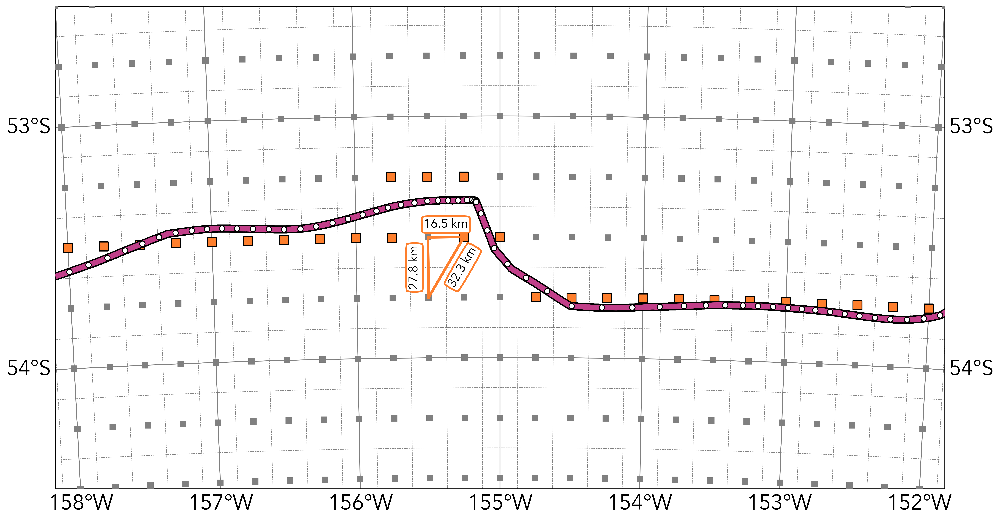

In [38]:
fig,ax = plt.subplots(figsize=(16,8),constrained_layout=True,subplot_kw=dict(projection=ccrs.SouthPolarStereo(central_longitude=-155)),dpi=600)

gl = ax.gridlines(draw_labels=False, xlocs=np.arange(-160.125,-150,0.25), ylocs=np.arange(-55.125,-52,0.25), color='0.5',zorder=2, ls="--",lw=0.5)
gl = ax.gridlines(draw_labels=True, y_inline=False,xlocs=np.arange(-160,-150,1), ylocs=np.arange(-55,-52,1), color='0.5',zorder=2, ls="-",lw=1,rotate_labels=0)

gl.top_labels = False
gl.left_labels = True
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

era.isel(time=0).sel(latitude=slice(-52,-56)).sel(longitude=slice(-180,-90)).plot.scatter(x="longitude",y="latitude",marker="s",ax=ax,transform=ccrs.PlateCarree(),zorder=3,c="grey",ec="None",lw=1,s=50)
era20ts.plot.scatter(x="longitude",y="latitude",marker="s",ax=ax,transform=ccrs.PlateCarree(),zorder=3,c=cera,ec="k",lw=1,s=100)

ds20.plot.scatter(x="longitude",y="latitude",marker="o",ax=ax,c=c20,ec="k",transform=ccrs.PlateCarree(),zorder=3,lw=3)
ds20.plot.scatter(x="longitude",y="latitude",marker="o",ax=ax,c=c20,ec="None",transform=ccrs.PlateCarree(),zorder=3,lw=3)
ds20h.plot.scatter(x="longitude",y="latitude",marker="o",ax=ax,c="w",transform=ccrs.PlateCarree(),zorder=3,ec="k",lw=1)

ax.plot([-155.5,-155.25],[-53.5,-53.5],transform=ccrs.PlateCarree(),zorder=3,c=cera,lw=3)
ax.plot([-155.5,-155.5],[-53.75,-53.5],transform=ccrs.PlateCarree(),zorder=3,c=cera,lw=3)
ax.plot([-155.5,-155.25],[-53.75,-53.5],transform=ccrs.PlateCarree(),zorder=3,c=cera,lw=3)

ax.text(-155.375,-53.475,
        f"{(gsw.distance([-155.5,-155.25],[-53.5,-53.5])[0]/1000).round(1)} km",
        ha="center",
        va="bottom",
        transform=ccrs.PlateCarree(),
        fontsize="xx-small",
        bbox=dict(boxstyle="round4,pad=0.2",
          fc="w",
          ec=cera, 
          lw=2),zorder=10)

ax.text(-155.55,-53.625,
        f"{(gsw.distance([-155.5,-155.5],[-53.75,-53.5])[0]/1000).round(1)} km",
        ha="right",
        va="center",
        transform=ccrs.PlateCarree(),
        fontsize="xx-small",
        bbox=dict(boxstyle="round4,pad=0.2",
          fc="w",
          ec=cera, 
          lw=2),zorder=10,
        rotation=90)

ax.text(-155.375,-53.625,
        f"{(gsw.distance([-155.5,-155.25],[-53.75,-53.5])[0]/1000).round(1)} km",
        ha="left",
        va="center",
        transform=ccrs.PlateCarree(),
        fontsize="xx-small",
        bbox=dict(boxstyle="round4,pad=0.2",
          fc="w",
          ec=cera, 
          lw=2),zorder=10,
        rotation=60)


ax.set_extent([-158,-152, -54.5,-52.5], ccrs.PlateCarree())



In [211]:
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
from matplotlib.patches import Polygon

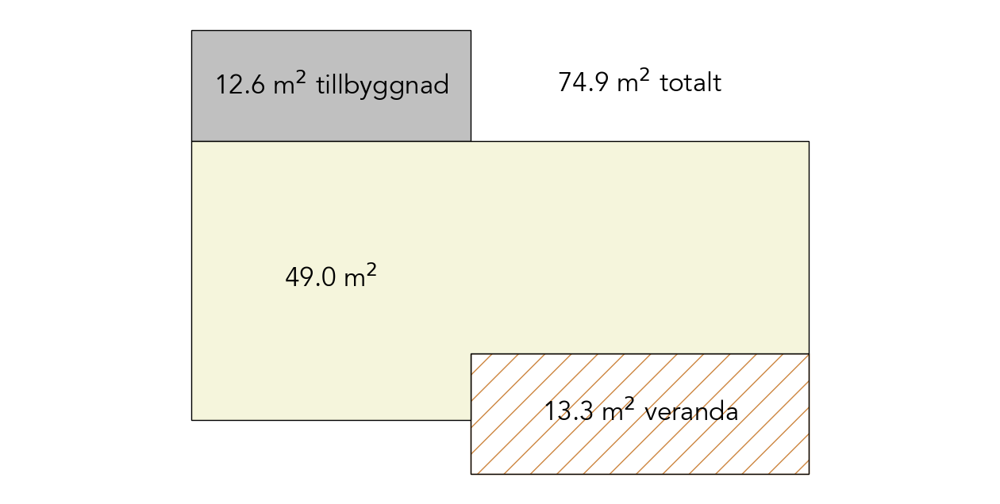

In [252]:
fig,ax = plt.subplots(figsize=(16,8))

sr = Polygon([(0,0),
              (0,5.05),
              (11.15,5.05),
              (11.15,5.05-3.85),
              (5.05,5.05-3.85),
              (5.05,0)], 
              closed=True, ec="k",fc="beige",zorder=2)


# vr = Rectangle([5.05,5.05-3.85],6.10,3.85, fc="w")
at = Rectangle([5.05,1.2],6.10,-1.2-0.975, fc="w",ec="peru",hatch="/",zorder=1)
at1 = Rectangle([5.05,1.2],6.10,-1.2-0.975, fc="None",ec="k",zorder=1)
nb = Rectangle([0,5.05],5.05,2, fc="silver", ec="k",zorder=1)

# ax.add_patch(sr)
ax.add_patch(sr)

ax.add_patch(at)
ax.add_patch(at1)
ax.add_patch(nb)

ax.text(5.05/2,5.05/2, fr"{np.round((5.05*5.05) + (6.10*3.85),1)} m$^{2}$", ha="center", va="center",zorder=3)
ax.text(5.05+6.10/2,1.2-(1.2+0.975)/2, fr"{np.round((6.10*(1.2+0.975)),1)} m$^{2}$ veranda", ha="center", va="center",zorder=3)
ax.text(5.05/2, 5.05 + 2/2, fr"{np.round((5.05*2.5),1)} m$^{2}$ tillbyggnad", ha="center", va="center",zorder=3)
ax.text(5.05+6.10/2,5.05 + 2/2, fr"{np.round((5.05*5.05) + (6.10*3.85) + (6.10*(1.2+0.975)) + (5.05*2.5),1)} m$^{2}$ totalt", ha="center", va="center",zorder=3)

#ax.set(xlim=(-0.5,12), ylim=(-2,10))
ax.axis("off")
ax.axis("equal")
plt.show()